In [1]:
# !aws s3 cp s3://largedonor/Crohns.zip .
# !unzip Crohns.zip

In [2]:
ls scvi-v2/src

ls: cannot access 'scvi-v2/src': No such file or directory


In [3]:
import sys
sys.path.insert(0, '/data/yosef3/users/can/mrvi_ibd/scvi-v2/src')
import scvi_v2
scvi_v2.__file__

Global seed set to 0
/data/yosef3/users/can/conda/envs/mrvi_new/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/data/yosef3/users/can/conda/envs/mrvi_new/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/data/yosef3/users/can/conda/envs/mrvi_new/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)


'/data/yosef3/users/can/mrvi_ibd/scvi-v2/src/scvi_v2/__init__.py'

In [4]:
import plotnine as p9
import pandas as pd
import glob
import os
import scanpy as sc
import numpy as np
import seaborn as sns
from scipy.cluster.hierarchy import linkage, fcluster, optimal_leaf_ordering
from scipy.spatial.distance import squareform
from tqdm import tqdm
import xarray as xr
import matplotlib.pyplot as plt
import pymde
from scipy.cluster.hierarchy import linkage, fcluster, optimal_leaf_ordering
from scipy.spatial.distance import squareform
from tqdm import tqdm
import xarray as xr
import matplotlib.pyplot as plt
import pymde

In [5]:
import os
os.environ["XLA_FLAGS"] = "--xla_gpu_force_compilation_parallelism=1"
# os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"

# Run mrVI

In [16]:
immune_aging = sc.read('/data/yosef3/users/can/immune_aging/doublet_removal/processing_results_newest/process_integration/All_filtered/All_filtered.unstim_cleanup.v2.h5ad')

Only considering the two last: ['.v2', '.h5ad'].
Only considering the two last: ['.v2', '.h5ad'].


In [17]:
celltypes_steven = pd.read_parquet('analysis_classification_25_knn.pqt', engine='pyarrow')
immune_aging = immune_aging[celltypes_steven.index]
immune_aging.obs['celltypes_steven'] = celltypes_steven.loc[immune_aging.obs_names]

celltypes_steven_old = pd.read_parquet('analysis_classification_knn.pqt', engine='pyarrow')
immune_aging = immune_aging[celltypes_steven_old.index]
immune_aging.obs['celltypes_steven_old'] = celltypes_steven_old.loc[immune_aging.obs_names]

dan_correction = pd.read_csv('NY_DR_disagreement_annotation.csv', index_col=0)
immune_aging.obs['dan_correction'] = immune_aging.obs['celltypes_steven'].astype(str)
immune_aging.obs.loc[dan_correction.index, 'dan_correction'] = dan_correction['DR_NY_annotation']

celltypes_groups = pd.read_parquet('schpf_groups.pqt', engine='pyarrow')
celltypes_groups.head()
immune_aging.obs['schpf_groups'] = celltypes_groups

/tmp/ipykernel_1598614/632807017.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/tmp/ipykernel_1598614/632807017.py:7: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


In [18]:
immune_aging

AnnData object with n_obs × n_vars = 1368656 × 36587
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'library', 'donor', 'site', 'age', 'sex', 'sample', 'chemistry', 'n_proteins', '_scvi_batch', '_scvi_labels', 'overclustering_percolate', 'sum_percolation_score', 'tissue', 'batch', 'bcr_library_id', 'tcr_library_id', 'celltypes_steven', 'celltypes_steven_old', 'dan_correction', 'schpf_groups'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'hsp', 'is_highly_variable_gene_batch_key_donor_id', 'is_highly_variable_gene_batch_key_donor_id+tissue'
    obsm: 'BCR_IR', 'TCR_IR', 'X_pca', 'X_scvi_integrated_batch_key_donor_id', 'X_scvi_integrated_batch_key_donor_id+tissue', 'X_umap_pca', 'X_umap_scvi_integrated_batch_key_donor_id', 'X_umap_scvi_integrated_batch_key_donor_id+tissue', 'bh_pval', 'celltypist', 'celltypist_probability_matrix.Immune_All_High', 'celltypist_probability_matrix.Immune_All_Low', 'clustering', 'donor_level_obs', 'hashtag', 'median_cluster_score', 'prot

In [19]:
immune_aging.obs['celltypes_steven_old'].value_counts()

celltypes_steven_old
b_memory                 146409
cd8_trm                  127234
macrophage               124952
b_naive                  105084
cd4_cm                   101915
cd4_naive                 96222
cd4_trm                   93989
monocyte_classical        84961
nk_cd56dim                80273
cd8_naive                 40932
cd4_tem                   39522
cd8_temra                 33733
fibroblast                31923
cd4_treg                  31913
plasma                    26643
nk_cd56br                 25930
cd8_tem                   25336
mast_cell                 17282
cd3_gd                    16989
endothelial               14514
epithelial                12644
nk_ilc_precursor          11900
monocyte_nonclassical     11652
ilc1                      10131
erythroid                  5367
disagreement               5196
cd8_mait                   5176
progenitor                 4888
ilc3                       4737
dc                         4521
cd4_temra          

In [20]:
immune_aging = immune_aging[~immune_aging.obs['dan_correction'].str.contains('lqe')]
immune_aging = immune_aging[immune_aging.obs['celltypes_steven'].dropna().index]
immune_aging = immune_aging[~immune_aging.obs['dan_correction'].isin(['epithelial', 'endothelial', 'fibroblast'])]
immune_aging = immune_aging[~immune_aging.obs['tissue'].isin(['THY'])]
immune_aging = immune_aging[~immune_aging.obs['tissue'].isin(['COLEPI'])]
immune_aging = immune_aging[~immune_aging.obs['tissue'].isin(['COLLP'])]
immune_aging = immune_aging[~immune_aging.obs['tissue'].isin(['LIV'])]

immune_aging.obs['site_tech'] = immune_aging.obs['site'].astype(str) + '_' + immune_aging.obs['chemistry'].astype(str)
immune_aging.obs['donor_site_tech'] = immune_aging.obs['donor'].astype(str) + '_' + immune_aging.obs['site'].astype(str) + '_' + immune_aging.obs['chemistry'].astype(str)

/tmp/ipykernel_1598614/265081881.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


In [21]:
immune_aging.layers['counts'] = immune_aging.X.copy()
sc.pp.normalize_total(immune_aging)
sc.pp.log1p(immune_aging)

immune_aging.raw = immune_aging

In [22]:
sc.pp.highly_variable_genes(
    immune_aging, n_top_genes=10000, subset=True, flavor='seurat_v3',
    batch_key='site_tech', layer='counts')

In [23]:
import flax.linen as nn
import jax.numpy as jnp

train_kwargs = {
    "early_stopping": True,
    "plan_kwargs": {"lr": 1e-3, "n_epochs_kl_warmup": 25},
}

model_kwargs = {
    "qz_nn_flavor": "attention",
    "px_nn_flavor": "attention",
    "qz_kwargs": {
        "use_map": False,
        "stop_gradients": False,
        "stop_gradients_mlp": True,
        "dropout_rate": 0.03
    },
    "px_kwargs": {
        "stop_gradients": False,
        "stop_gradients_mlp": True,
        "h_activation": nn.softmax,
        "dropout_rate": 0.03,
        "low_dim_batch": True
    },
    "learn_z_u_prior_scale": False,
    "z_u_prior": True,
    "u_prior_mixture": True,
    "u_prior_mixture_k": 100,
}

In [24]:
from scvi_v2 import MrVI

In [ ]:
retrain = True

if retrain==True:
    scvi_v2.MrVI.setup_anndata(immune_aging, sample_key="tissue", batch_key="donor_site_tech", layer="counts", labels_key='schpf_groups')
    mrvi_model = scvi_v2.MrVI(immune_aging, n_latent=30, **model_kwargs)
    mrvi_model.train(max_epochs=50, **train_kwargs)
    mrvi_model.save("immuneaging_mrvi_final_tissue_mog_groups", save_anndata=True, overwrite=True)
else:
    mrvi_model = scvi_v2.MrVI.load("immuneaging_mrvi_final_tissue_mog_groups", adata=immune_aging)
# Get z representation
immune_aging.obsm["X_mrvi_z"] = mrvi_model.get_latent_representation(give_z=True)
# Get u representation
immune_aging.obsm["X_mrvi_u"] = mrvi_model.get_latent_representation(give_z=False)

INFO     Jax module moved to GPU. Note: Pytorch lightning will show GPU is not being used for the Trainer.         


/data/yosef3/users/can/conda/envs/mrvi_new/lib/python3.9/site-packages/lightning_fabric/plugins/environments/slurm.py:166: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /data/yosef3/users/can/conda/envs/mrvi_new/lib/pytho ...
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/data/yosef3/users/can/conda/envs/mrvi_new/lib/python3.9/site-packages/lightning_fabric/plugins/environments/slurm.py:166: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /data/yosef3/users/can/conda/envs/mrvi_new/lib/pytho ...


Epoch 24/50:  46%|█████████████████████████████████▌                                       | 23/50 [1:48:16<2:01:16, 269.48s/it, v_num=1, train_loss_step=1.57e+3, train_loss_epoch=1.65e+3]

In [28]:
# Get z representation
immune_aging.obsm["X_mrvi_z"] = mrvi_model.get_latent_representation(give_z=True)
# Get u representation
immune_aging.obsm["X_mrvi_u"] = mrvi_model.get_latent_representation(give_z=False)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9929/9929 [01:40<00:00, 98.59it/s]


<Axes: xlabel='epoch'>

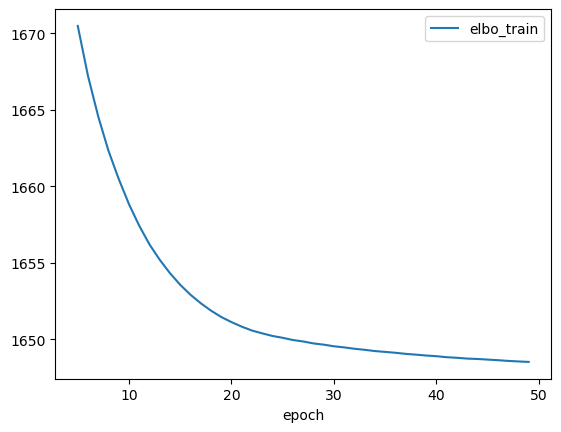

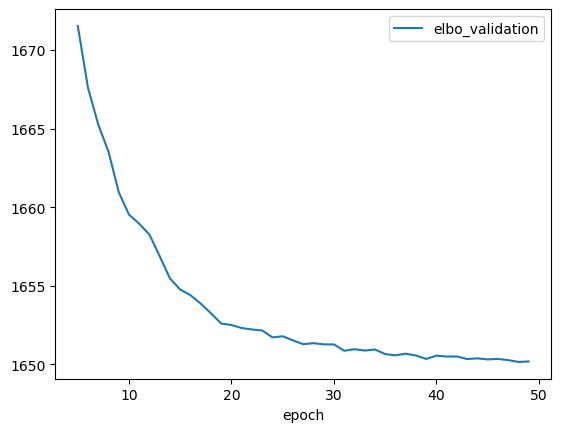

In [29]:
mrvi_model.history_["elbo_train"][5:].plot()
mrvi_model.history_["elbo_validation"][5:].plot()

IOStream.flush timed out
IOStream.flush timed out
/data/yosef3/users/can/conda/envs/mrvi_new/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/data/yosef3/users/can/conda/envs/mrvi_new/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


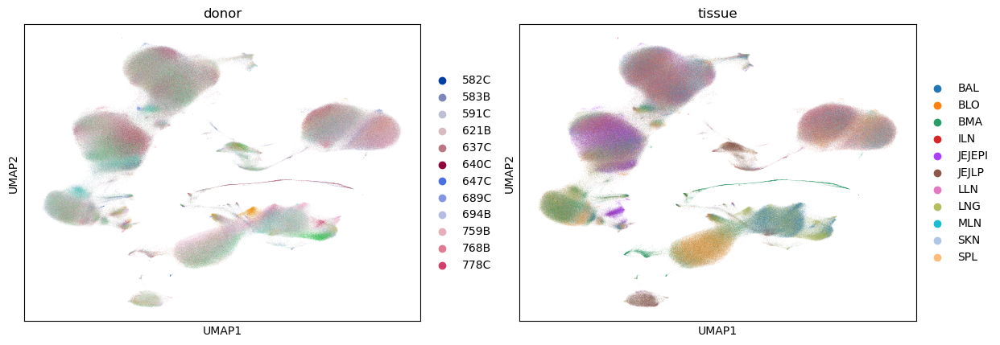

In [33]:
sc.pp.neighbors(immune_aging, use_rep="X_mrvi_u", key_added="mrvi_u", n_neighbors=15)
sc.tl.umap(immune_aging, neighbors_key="mrvi_u", min_dist=0.3)
sc.pl.umap(immune_aging, color=['donor', 'tissue'], neighbors_key="mrvi_u")

/data/yosef3/users/can/conda/envs/mrvi_new/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/data/yosef3/users/can/conda/envs/mrvi_new/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


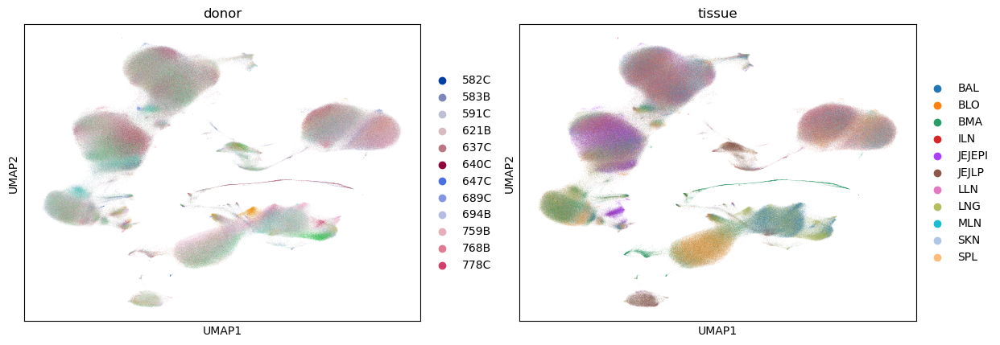

In [35]:
sc.pl.umap(immune_aging, color=['donor', 'tissue'], neighbors_key="mrvi_u")

/data/yosef3/users/can/conda/envs/mrvi_new/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


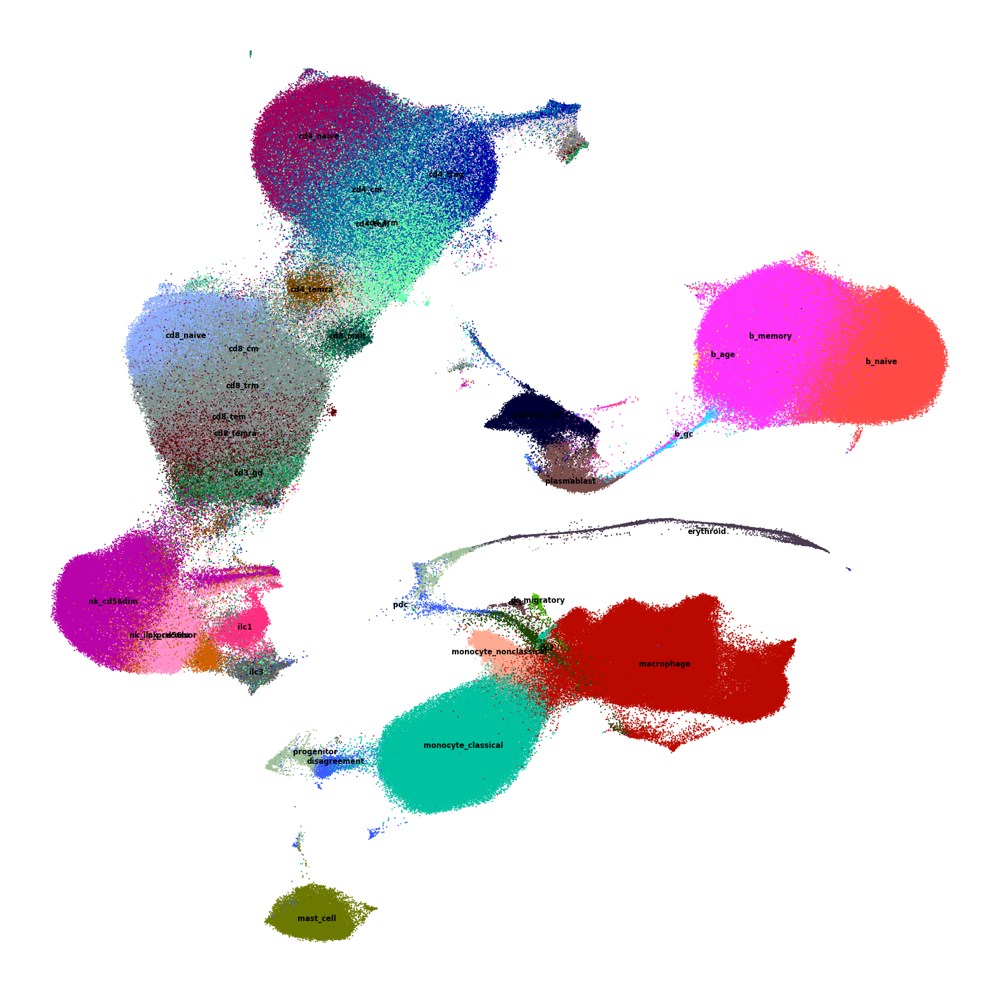

In [36]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(20, 20))
sc.pl.umap(
    immune_aging, 
    color="celltypes_steven",
    frameon=False,
    title="",
    legend_loc="on data",
    legend_fontsize="small",
    ax=ax, neighbors_key="mrvi_u", size=10
)

In [37]:
cell_sample_sample_distances = mrvi_model.get_local_sample_distances(batch_size=512, use_vmap=True, normalize_distances=True, norm='l2', mc_samples=20)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2483/2483 [1:33:57<00:00,  2.27s/it]


In [38]:
cell_sample_sample_distances.to_netcdf("immuneaging_mrvi_tissue.nc")

In [39]:
immune_aging.write('mrvi_immuneaging_tissue.h5ad')

# Distance matrix

In [40]:
dmats = xr.open_dataset(f"immuneaging_mrvi_tissue.nc")

In [41]:
donor_info = immune_aging.obs.drop_duplicates("tissue").set_index("tissue")
donor_info['tissue'] = donor_info.index

In [42]:
dmats = cell_sample_sample_distances

In [43]:
'BLD BOM SPL LLN ILN MLN JLP JEL LNG BAL'.split(' ')

['BLD', 'BOM', 'SPL', 'LLN', 'ILN', 'MLN', 'JLP', 'JEL', 'LNG', 'BAL']

In [44]:
'BLD BOM SPL LLN ILN MLN JLP JEL LNG BAL'

'BLD BOM SPL LLN ILN MLN JLP JEL LNG BAL'

In [45]:
dmats["sample_x"].values

array(['BAL', 'BLO', 'BMA', 'ILN', 'JEJEPI', 'JEJLP', 'LLN', 'LNG', 'MLN',
       'SKN', 'SPL'], dtype=object)

In [46]:
from cmath import inf
import seaborn as sns
from matplotlib import pyplot as plt
import scanpy as sc

sns.reset_orig()
sc.settings._vector_friendly = True
# p9.theme_set(p9.theme_classic)
plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["savefig.transparent"] = True

plt.rcParams["axes.titlesize"] = 15
plt.rcParams["axes.titleweight"] = 500
plt.rcParams["axes.titlepad"] = 8.0
plt.rcParams["axes.labelsize"] = 14
plt.rcParams["axes.labelweight"] = 500
plt.rcParams["axes.linewidth"] = 1.2
plt.rcParams["axes.labelpad"] = 6.0
plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.spines.right"] = False

plt.rcParams["font.size"] = 11
# plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica', "Computer Modern Sans Serif", "DejaVU Sans"]
plt.rcParams['font.weight'] = 500

plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['xtick.minor.size'] = 1.375
plt.rcParams['xtick.major.size'] = 2.75
plt.rcParams['xtick.major.pad'] = 2
plt.rcParams['xtick.minor.pad'] = 2

plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['ytick.minor.size'] = 1.375
plt.rcParams['ytick.major.size'] = 2.75
plt.rcParams['ytick.major.pad'] = 2
plt.rcParams['ytick.minor.pad'] = 2

plt.rcParams["legend.fontsize"] = 12
plt.rcParams['legend.handlelength'] = 1.4
plt.rcParams['legend.numpoints'] = 1
plt.rcParams['legend.scatterpoints'] = 3

plt.rcParams['lines.linewidth'] = 1.7
DPI = 300
sc.settings.set_figure_params(dpi_save=300, frameon=False, format='pdf', transparent=True)

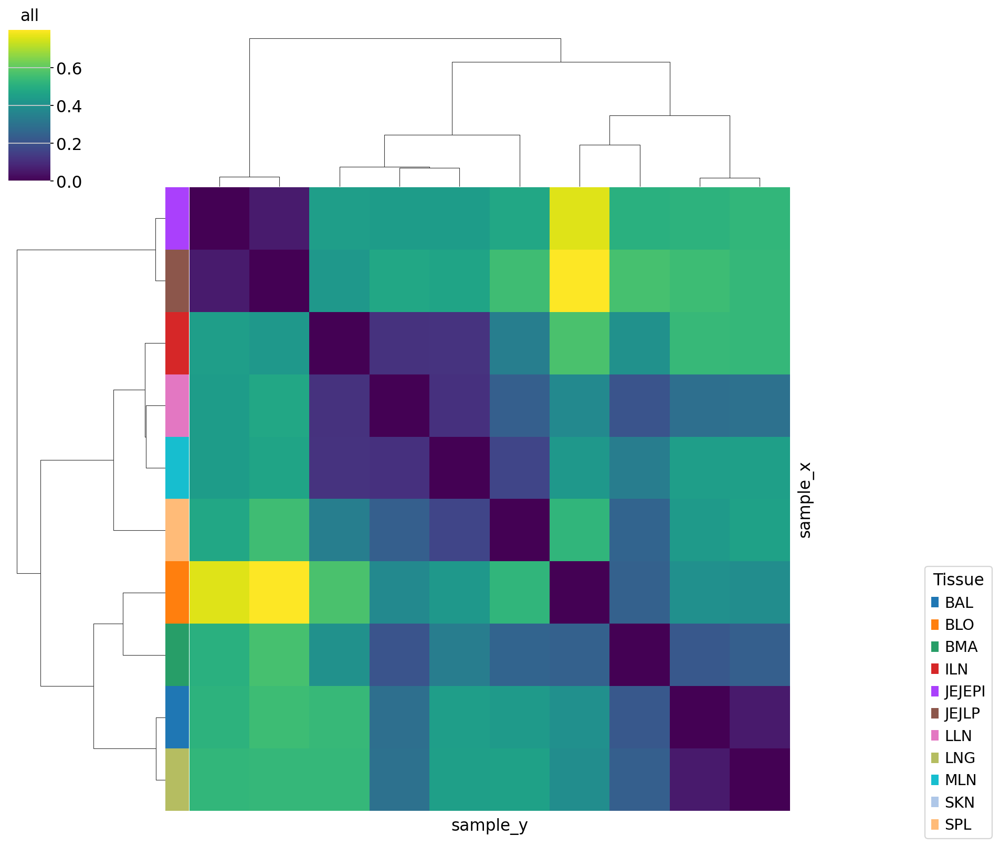

In [51]:
dmat1 =(
    dmats['cell']
    .loc[{"sample_x": ['BLO', 'BMA', 'SPL', 'LLN', 'ILN', 'MLN', 'JEJLP', 'JEJEPI', 'LNG', 'BAL']}]
    .loc[{"sample_y": ['BLO', 'BMA', 'SPL', 'LLN', 'ILN', 'MLN', 'JEJLP', 'JEJEPI', 'LNG', 'BAL']}]
    .mean('cell_name')
    .squeeze()
    .to_pandas()
)

dists = squareform(dmat1.values)
Z = linkage(dists, method="ward")
Z = optimal_leaf_ordering(Z, dists)

from matplotlib.patches import Patch

subset_donor_info = donor_info.loc[dmat1.index]

color_tissue = [immune_aging.uns['tissue_colors'][i] for i in subset_donor_info["tissue"].cat.codes]

sns.clustermap(dmat1, row_linkage=Z, col_linkage=Z, cmap="viridis",
           row_colors=[color_tissue], yticklabels=False, xticklabels=False)

handles = [Patch(facecolor=i) for i in immune_aging.uns['tissue_colors']]
location_legend = plt.legend(handles, immune_aging.obs['tissue'].cat.categories, title='Tissue',
           bbox_to_anchor = (1.2, 0.35),bbox_transform=plt.gcf().transFigure, loc='upper right')

plt.title('all')
plt.savefig(f'export_figures_tissue/distance_matrix_tissue_all.pdf', bbox_inches='tight')
dmat1.to_csv('export_figures_tissue/distance_matrix_tissue_all.csv')
plt.show()
dists_all = dists

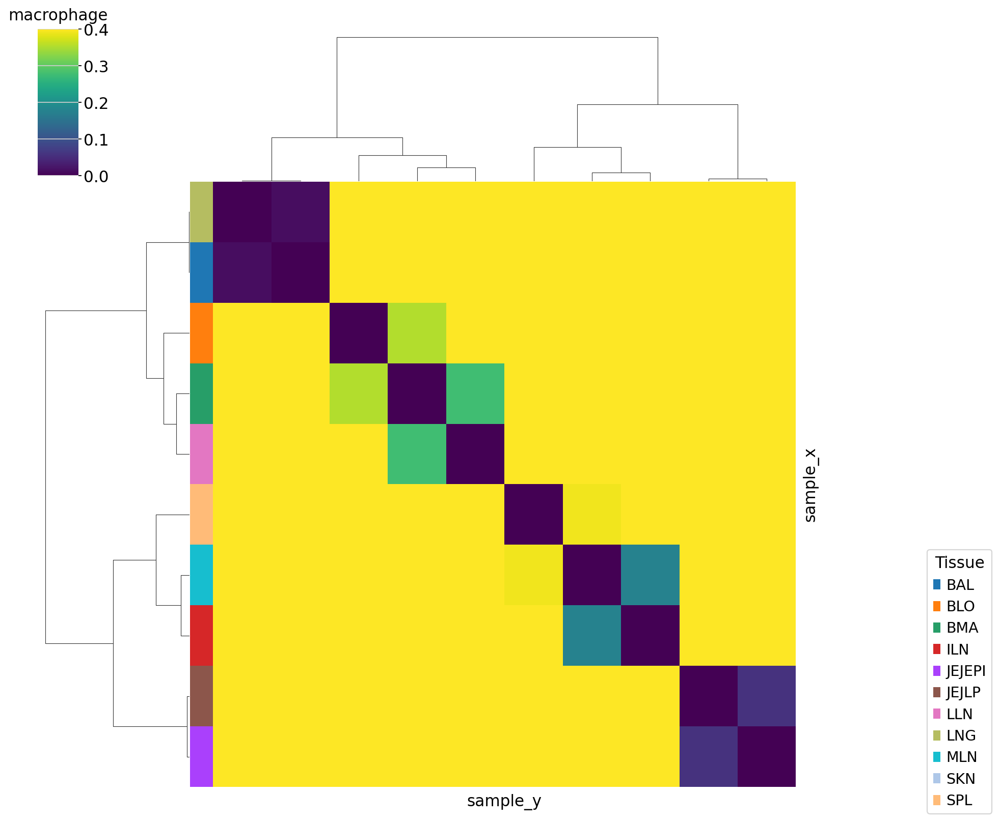

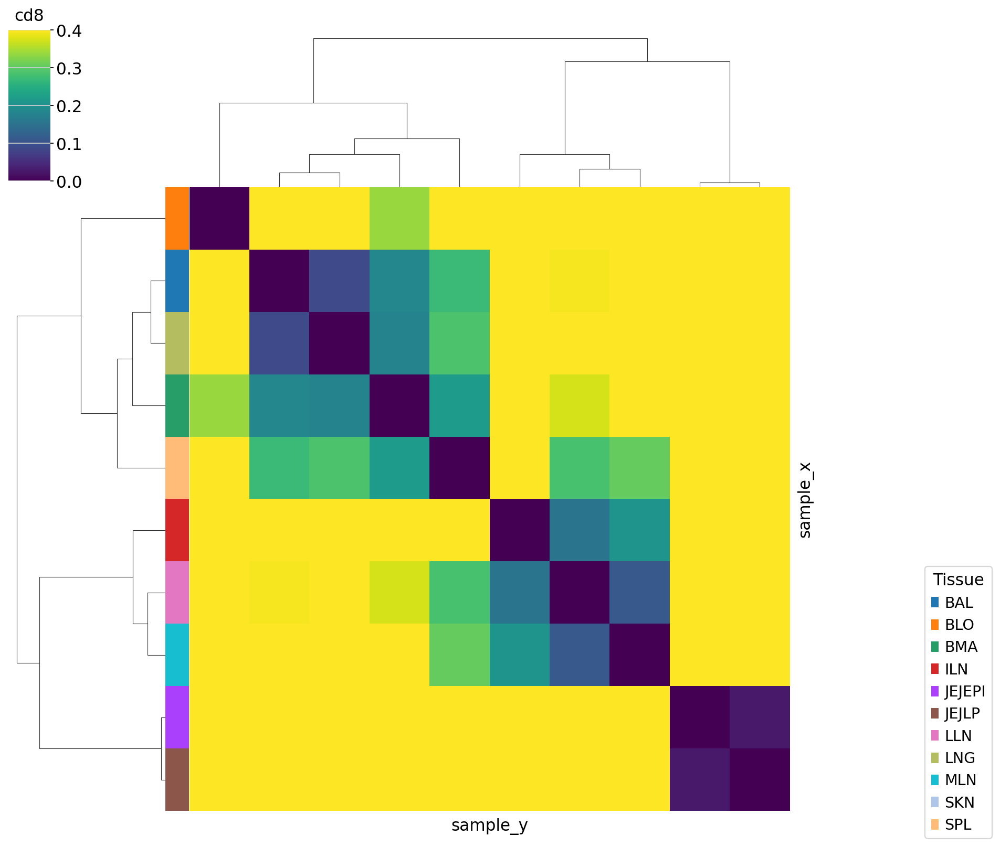

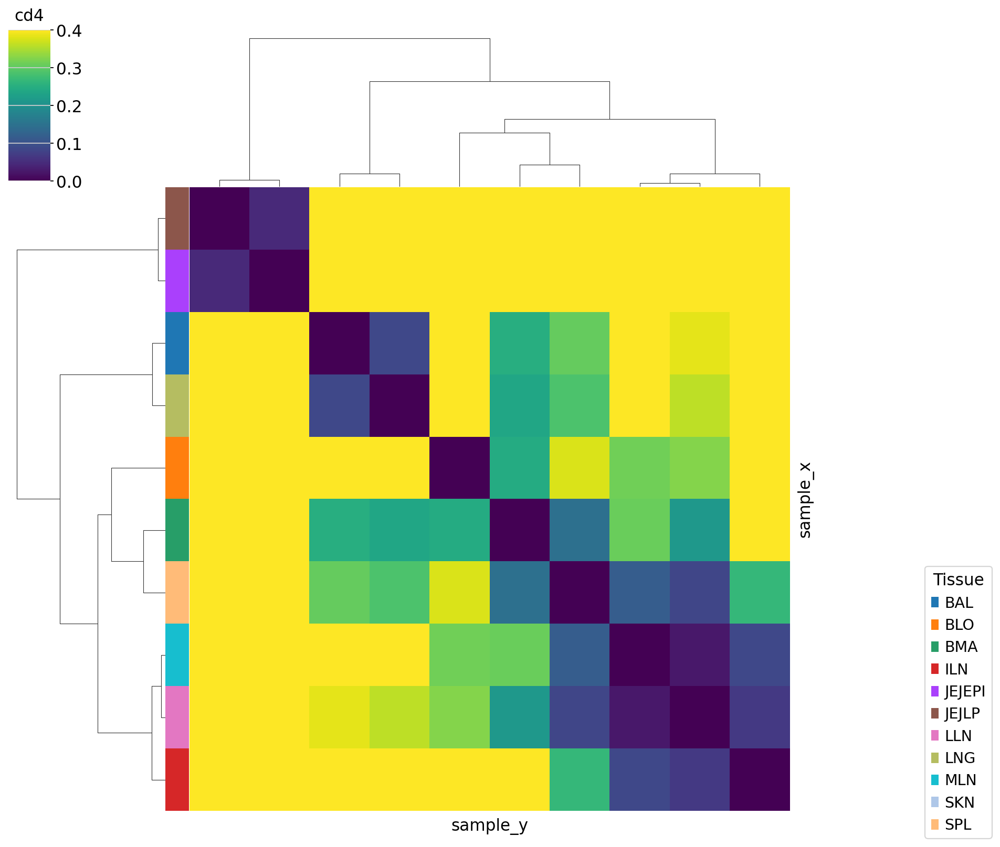

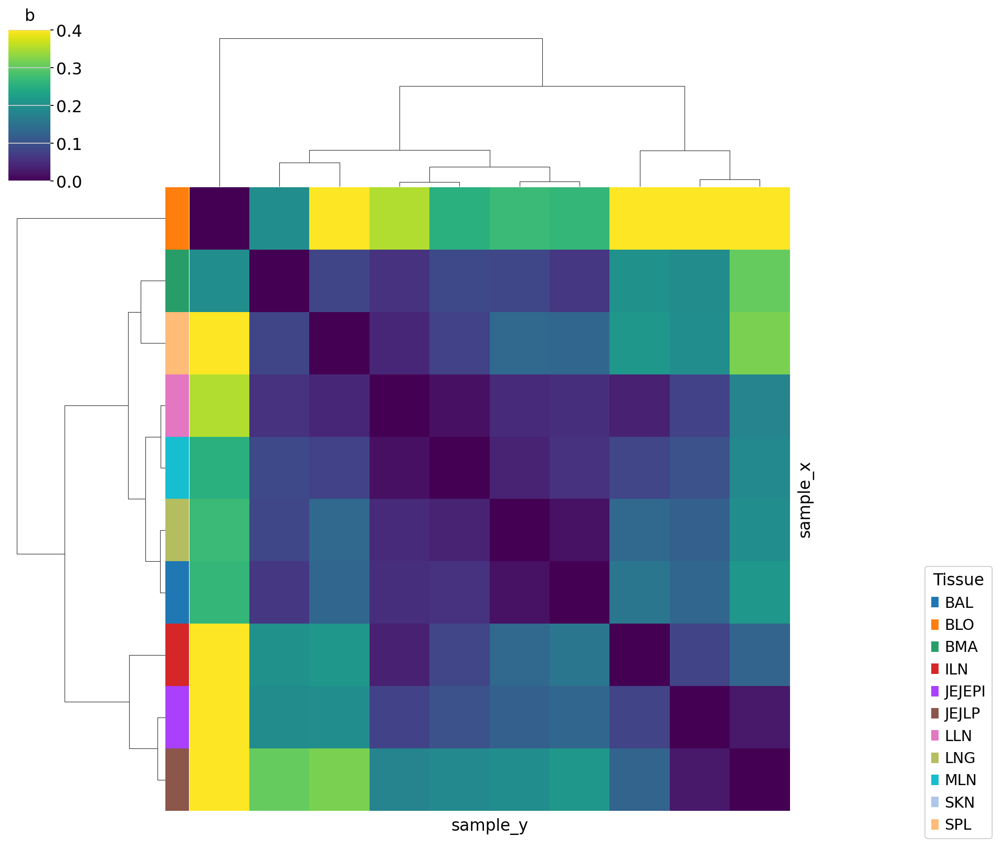

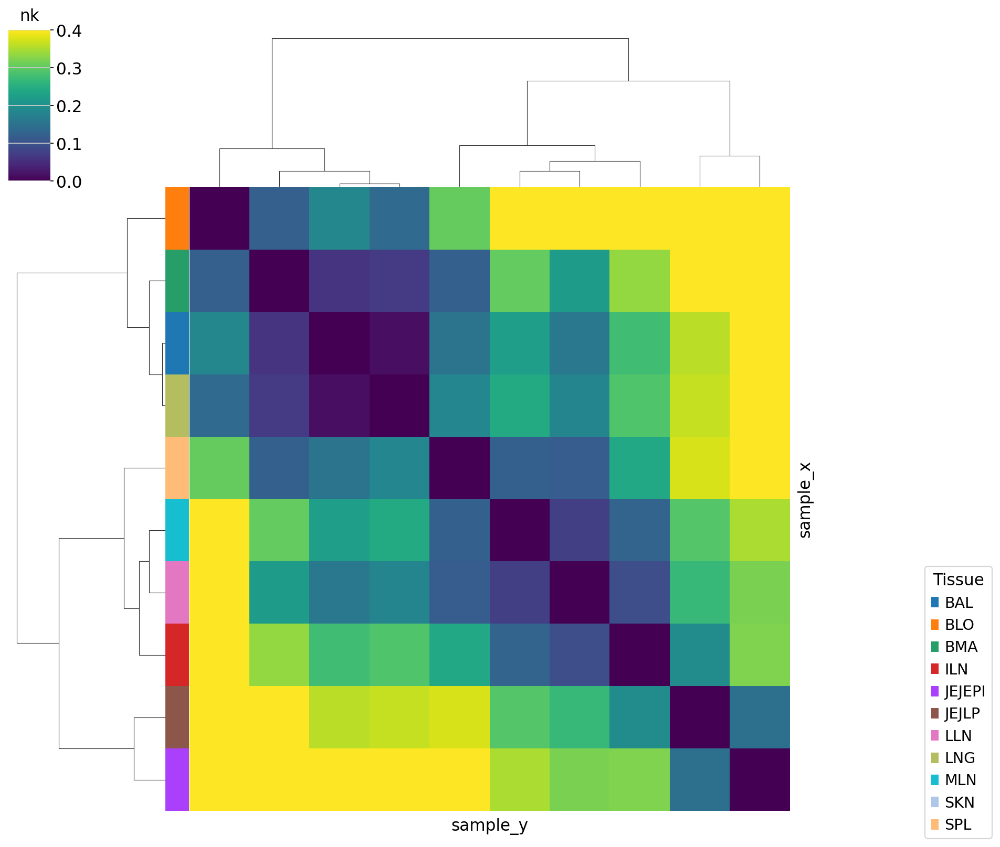

...

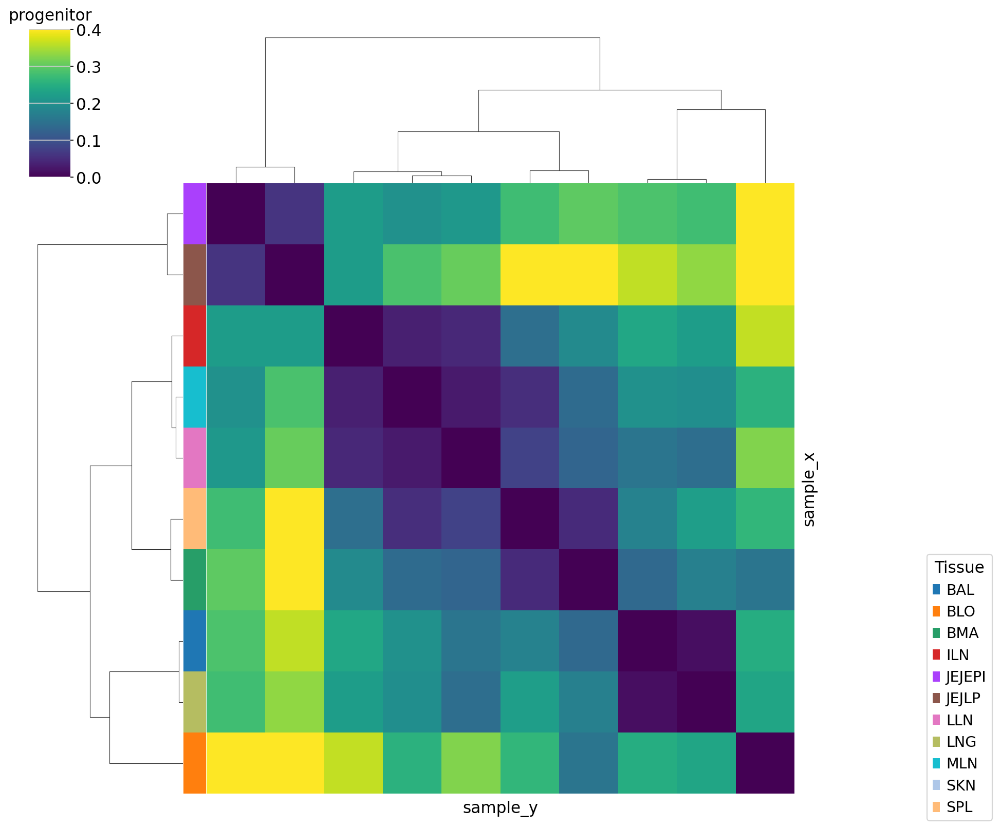

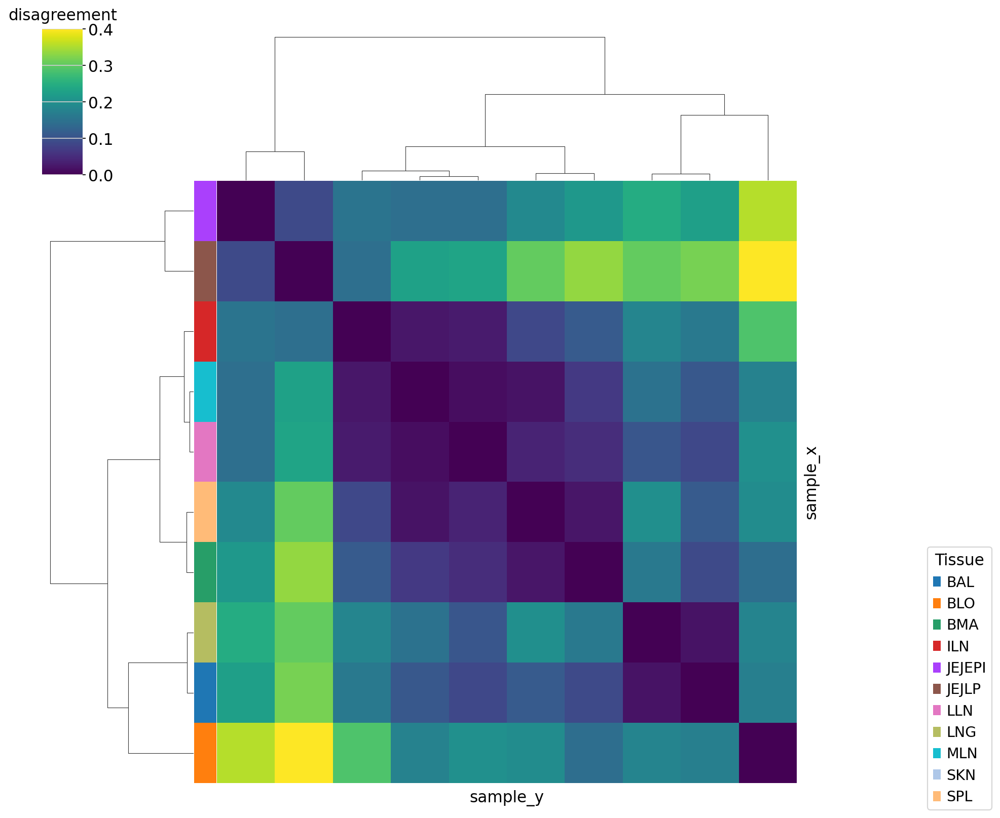

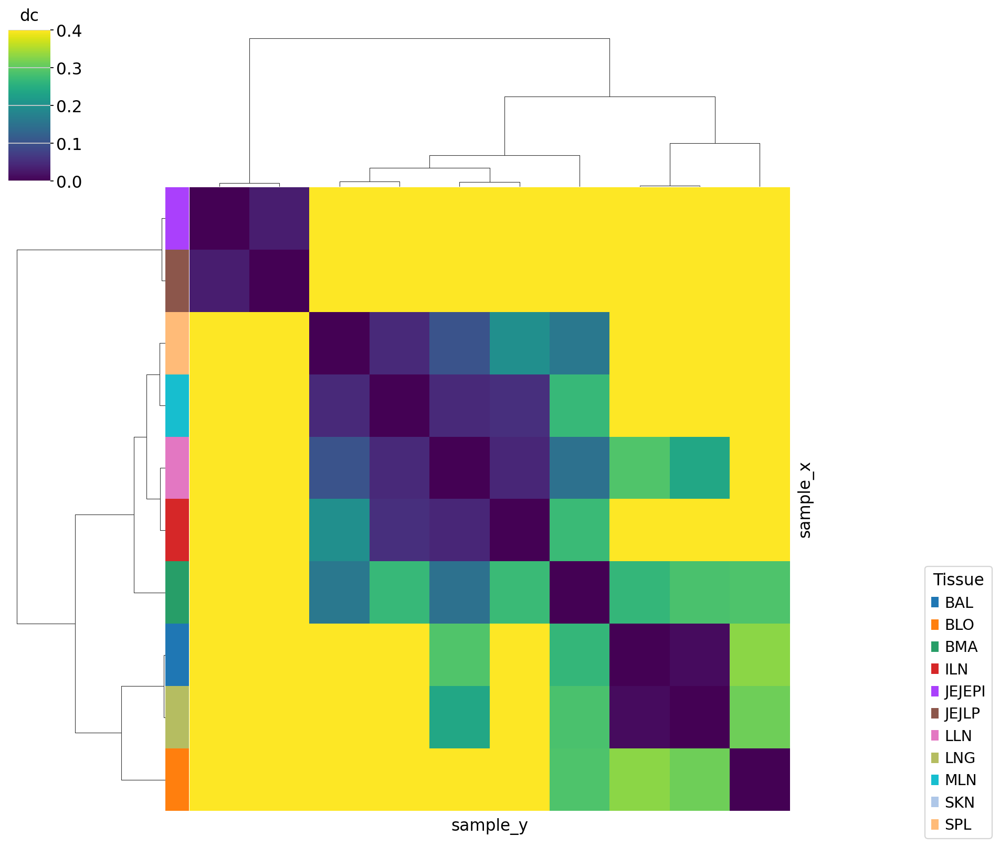

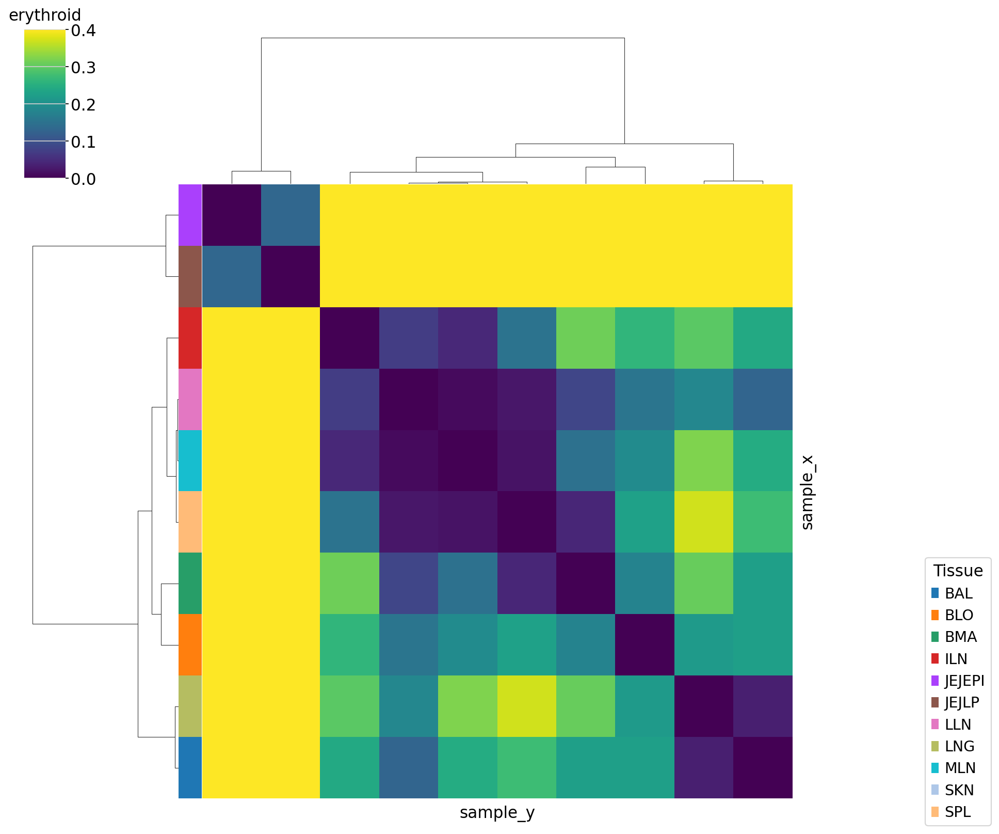

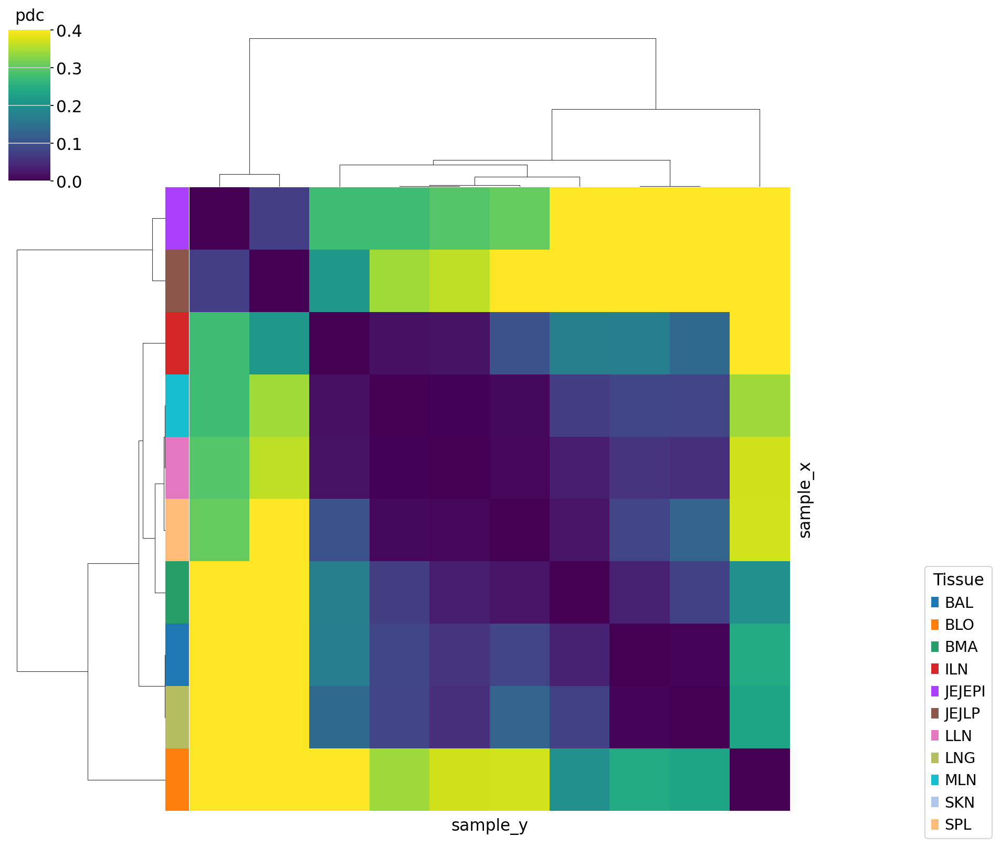

In [52]:
for ct in immune_aging.obs['schpf_groups'].unique():
    dmat1 = (
        dmats['cell']
        .isel({"cell_name": immune_aging.obs['schpf_groups']==ct})
        .loc[{"sample_x": ['BLO', 'BMA', 'SPL', 'LLN', 'ILN', 'MLN', 'JEJLP', 'JEJEPI', 'LNG', 'BAL']}]
        .loc[{"sample_y": ['BLO', 'BMA', 'SPL', 'LLN', 'ILN', 'MLN', 'JEJLP', 'JEJEPI', 'LNG', 'BAL']}]
        .mean('cell_name')
        .squeeze()
        .to_pandas()
    )
    dists = squareform(dmat1.values)
    Z = linkage(dists, method="ward")
    Z = optimal_leaf_ordering(Z, dists)

    from matplotlib.patches import Patch

    subset_donor_info = donor_info.loc[dmat1.index]

    color_tissue = [immune_aging.uns['tissue_colors'][i] for i in subset_donor_info["tissue"].cat.codes]

    sns.clustermap(dmat1, row_linkage=Z, col_linkage=Z, cmap="viridis",
               row_colors=[color_tissue], yticklabels=False, xticklabels=False, vmax=0.4)

    handles = [Patch(facecolor=i) for i in immune_aging.uns['tissue_colors']]
    location_legend = plt.legend(handles, immune_aging.obs['tissue'].cat.categories, title='Tissue',
               bbox_to_anchor = (1.2, 0.35),bbox_transform=plt.gcf().transFigure, loc='upper right')

    plt.title(ct)
    plt.savefig(f'export_figures_tissue/distance_matrix_tissue_{ct}.pdf', bbox_inches='tight')
    dmat1.to_csv(f'export_figures_tissue/distance_matrix_tissue_{ct}.csv')
    plt.show()

In [54]:
os.mkdir('export_figures_tissue_fine')

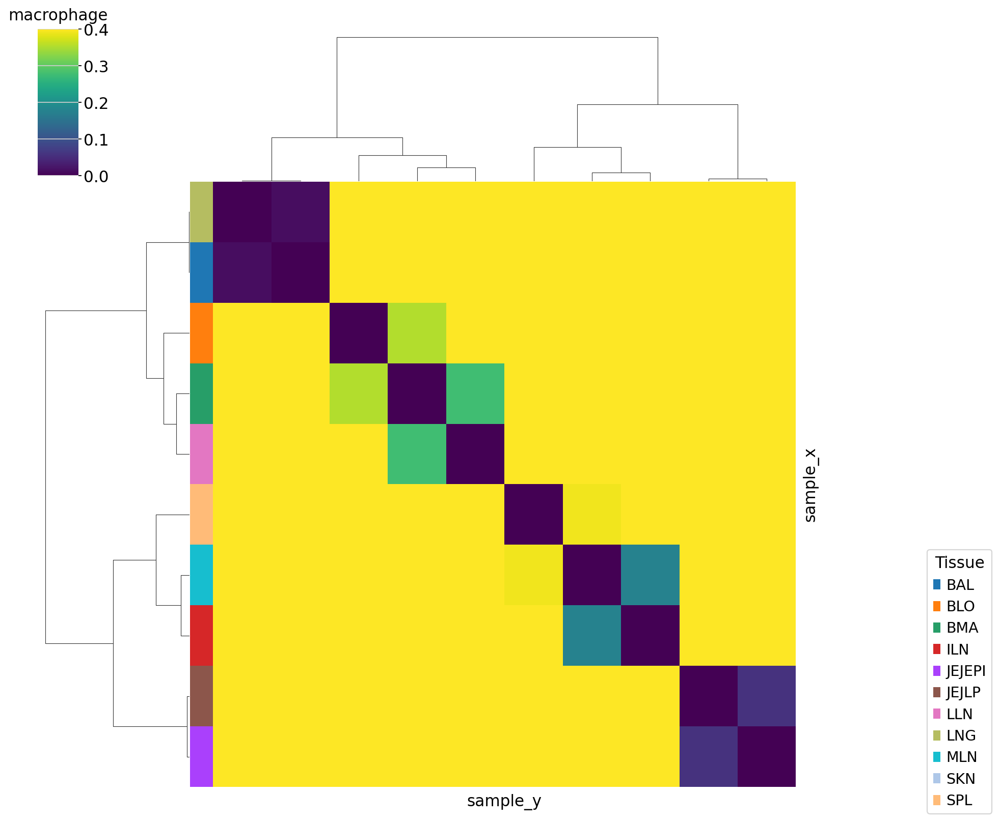

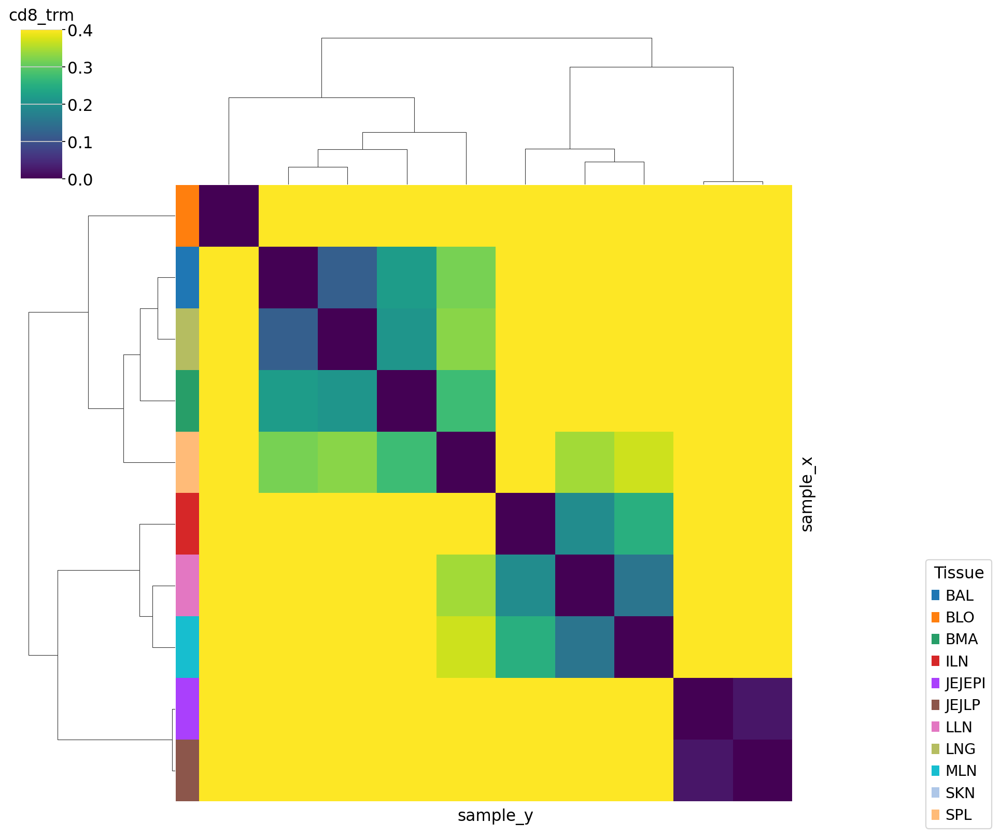

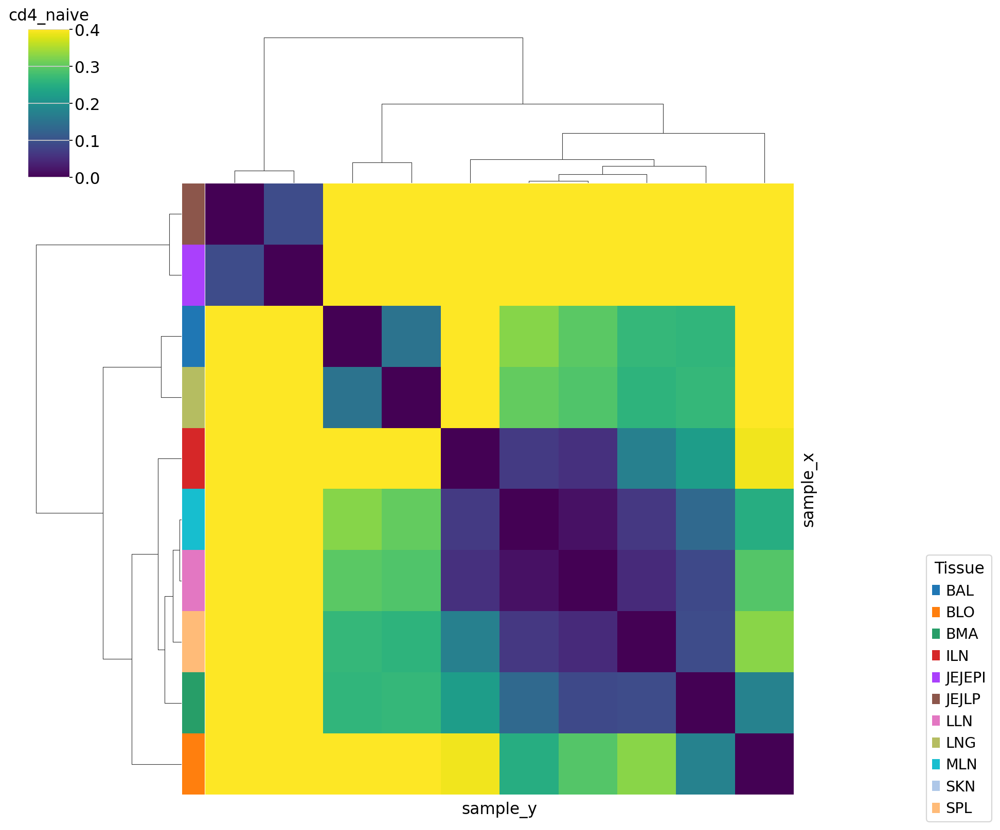

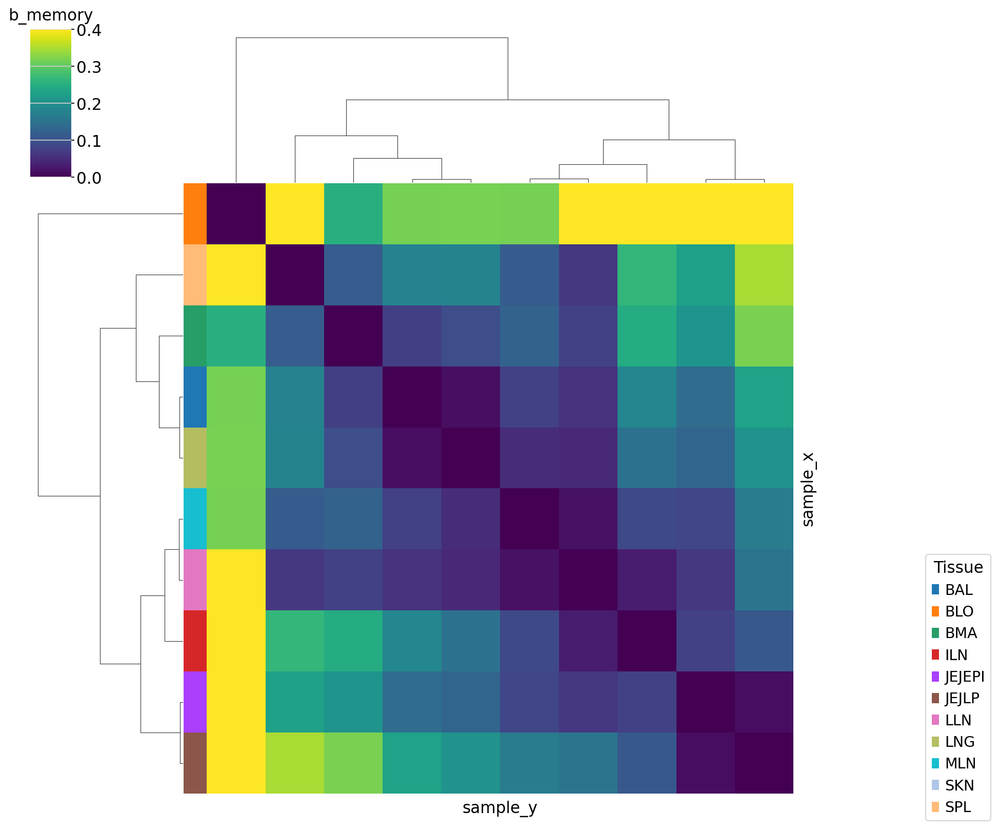

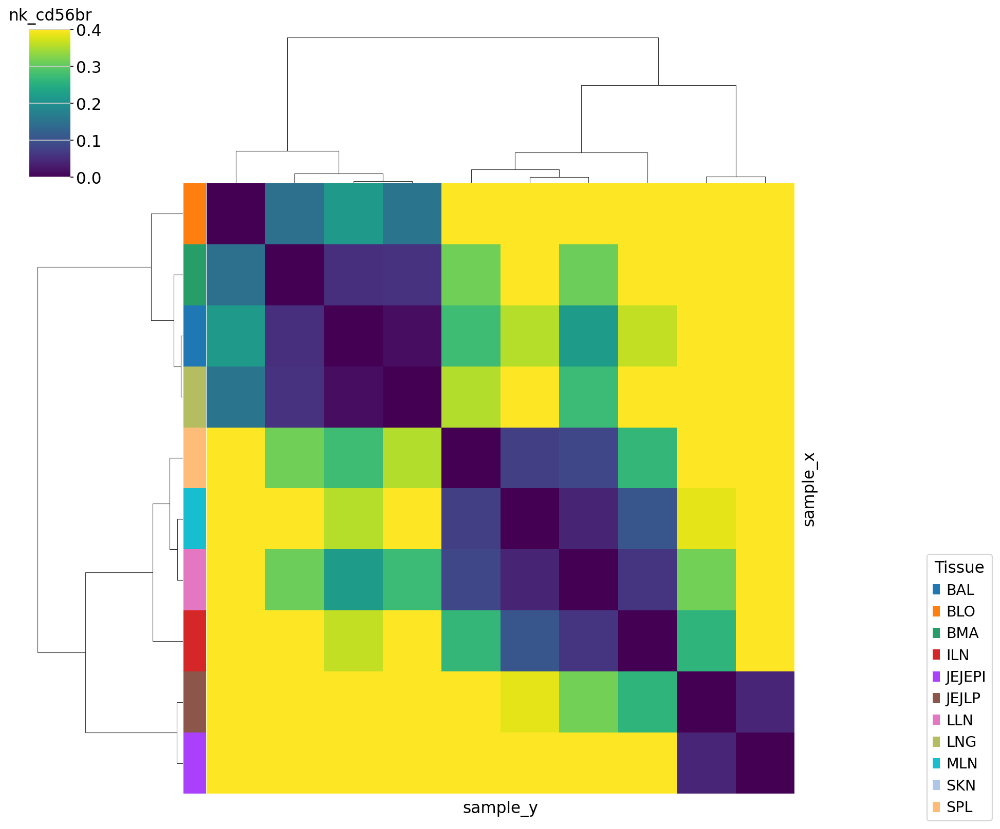

...

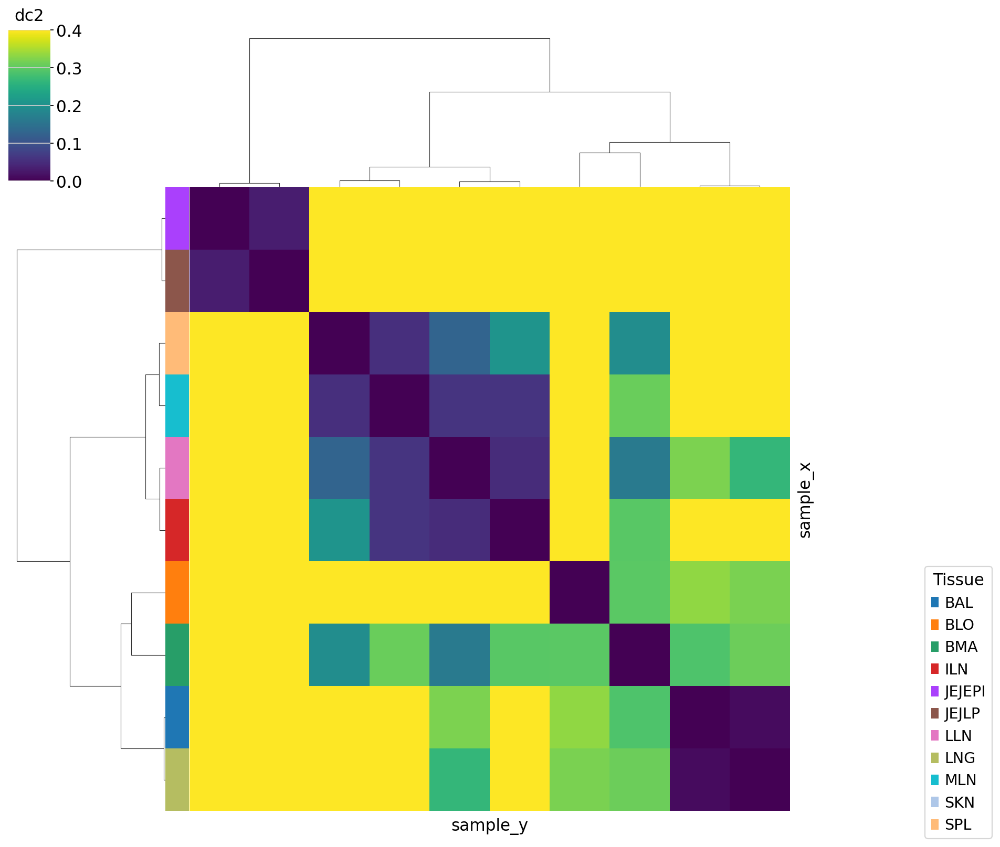

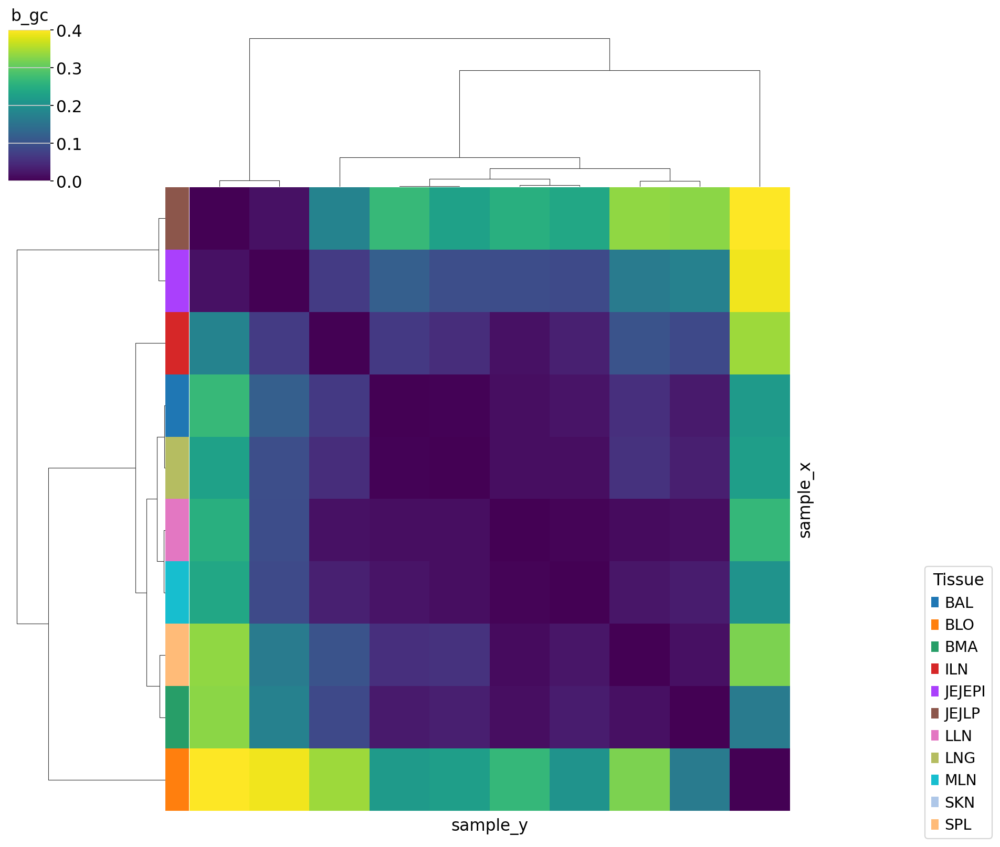

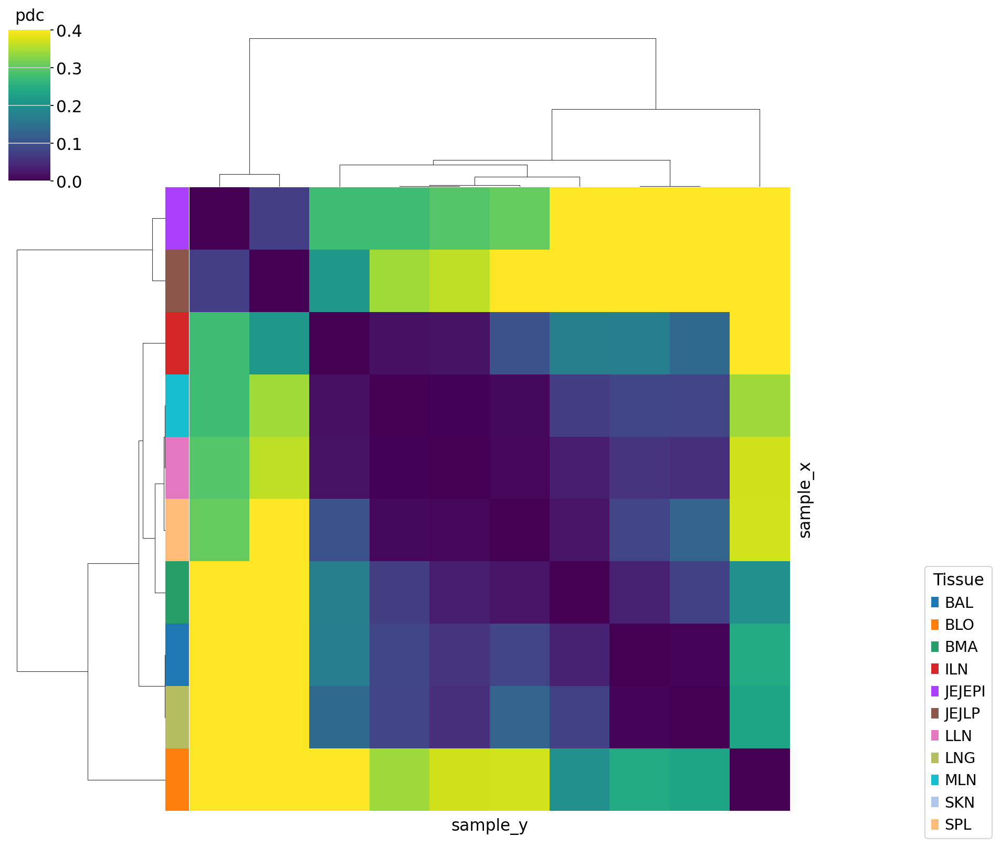

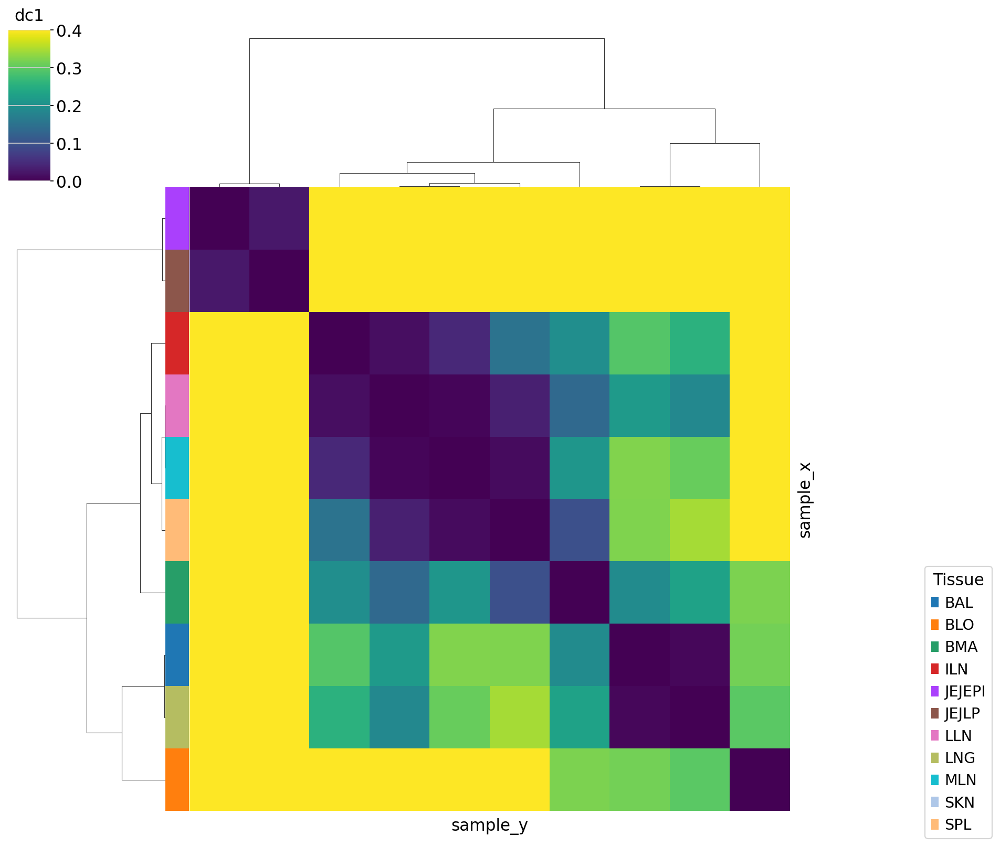

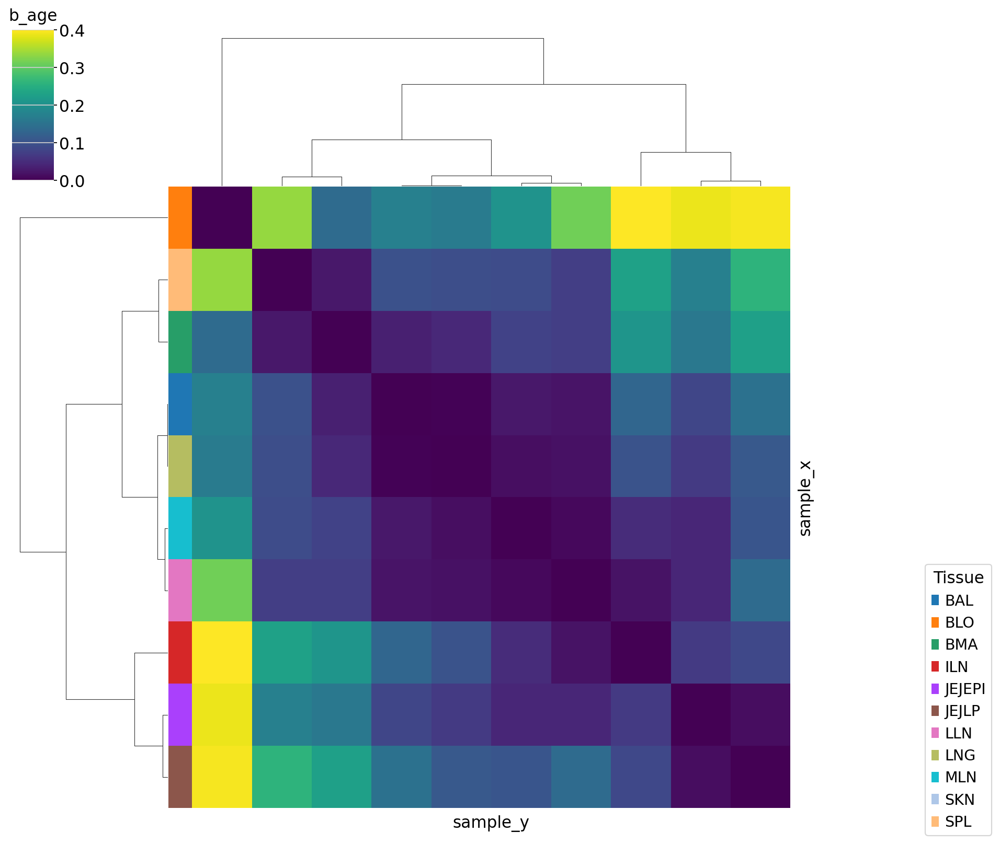

In [55]:
for ct in immune_aging.obs['celltypes_steven'].unique():
    dmat1 = (
        dmats['cell']
        .isel({"cell_name": immune_aging.obs['celltypes_steven']==ct})
        .loc[{"sample_x": ['BLO', 'BMA', 'SPL', 'LLN', 'ILN', 'MLN', 'JEJLP', 'JEJEPI', 'LNG', 'BAL']}]
        .loc[{"sample_y": ['BLO', 'BMA', 'SPL', 'LLN', 'ILN', 'MLN', 'JEJLP', 'JEJEPI', 'LNG', 'BAL']}]
        .mean('cell_name')
        .squeeze()
        .to_pandas()
    )
    dists = squareform(dmat1.values)
    Z = linkage(dists, method="ward")
    Z = optimal_leaf_ordering(Z, dists)

    from matplotlib.patches import Patch

    subset_donor_info = donor_info.loc[dmat1.index]

    color_tissue = [immune_aging.uns['tissue_colors'][i] for i in subset_donor_info["tissue"].cat.codes]

    sns.clustermap(dmat1, row_linkage=Z, col_linkage=Z, cmap="viridis",
               row_colors=[color_tissue], yticklabels=False, xticklabels=False, vmax=0.4)

    handles = [Patch(facecolor=i) for i in immune_aging.uns['tissue_colors']]
    location_legend = plt.legend(handles, immune_aging.obs['tissue'].cat.categories, title='Tissue',
               bbox_to_anchor = (1.2, 0.35),bbox_transform=plt.gcf().transFigure, loc='upper right')

    plt.title(ct)
    plt.savefig(f'export_figures_tissue_fine/distance_matrix_tissue_{ct}.pdf', bbox_inches='tight')
    dmat1.to_csv(f'export_figures_tissue_fine/distance_matrix_tissue_{ct}.csv')
    plt.show()

In [56]:
!zip -r export_figures_tissue.zip export_figures_tissue
!zip -r export_figures_tissue_fine.zip export_figures_tissue_fine

  adding: export_figures_tissue/ (stored 0%)
  adding: export_figures_tissue/distance_matrix_tissue_pdc.csv (deflated 62%)
  adding: export_figures_tissue/distance_matrix_tissue_erythroid.csv (deflated 61%)
  adding: export_figures_tissue/distance_matrix_tissue_nk.csv (deflated 61%)
  adding: export_figures_tissue/distance_matrix_tissue_ilc.csv (deflated 61%)
  adding: export_figures_tissue/distance_matrix_tissue_disagreement.csv (deflated 62%)
  adding: export_figures_tissue/distance_matrix_tissue_cd8.pdf (deflated 9%)
  adding: export_figures_tissue/distance_matrix_tissue_plasma.csv (deflated 62%)
  adding: export_figures_tissue/distance_matrix_tissue_all.pdf (deflated 10%)
  adding: export_figures_tissue/distance_matrix_tissue_{ct}.csv (deflated 62%)
  adding: export_figures_tissue/distance_matrix_tissue_monocyte_classical.pdf (deflated 10%)
  adding: export_figures_tissue/distance_matrix_tissue_dc.pdf (deflated 9%)
  adding: export_figures_tissue/distance_matrix_tissue_cd4.csv (def

In [ ]:
immune_aging.obsm['X_mrvi_eps'] = immune_aging.obsm['X_mrvi_z'] - immune_aging.obsm['X_mrvi_u']
immune_aging.obs['local_eps_strength'] = np.sum(immune_aging.obsm['X_mrvi_eps']**2, axis=1)
immune_aging.obs['mean_local_distances'] = dmats['cell'].values.mean(-1).mean(-1)
immune_aging.obs['median_local_distances'] = np.median(dmats['cell'].values.reshape(immune_aging.n_obs, -1), axis=1)
immune_aging.obs['var_local_distances'] = np.var(dmats['cell'].values.reshape(immune_aging.n_obs, -1), axis=1)

/data/yosef3/users/can/conda/envs/mrvi_new/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


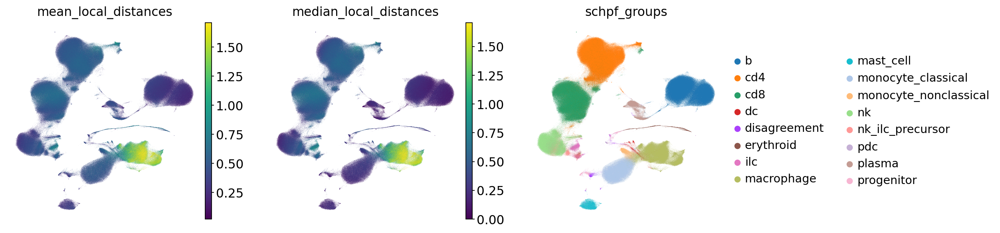

In [64]:
sc.pl.umap(immune_aging,
           color=['mean_local_distances', 'median_local_distances', 'schpf_groups'],
           neighbors_key="mrvi_u", vmax='p99')

/data/yosef3/users/can/conda/envs/mrvi_new/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


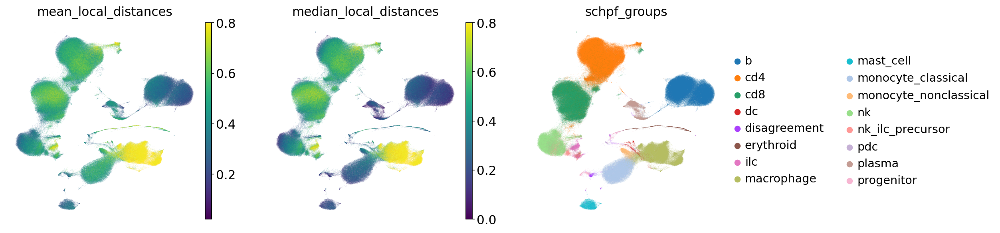

In [67]:
sc.pl.umap(immune_aging,
           color=['mean_local_distances', 'median_local_distances', 'schpf_groups'],
           neighbors_key="mrvi_u", vmax=0.8)

/data/yosef3/users/can/conda/envs/mrvi_new/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


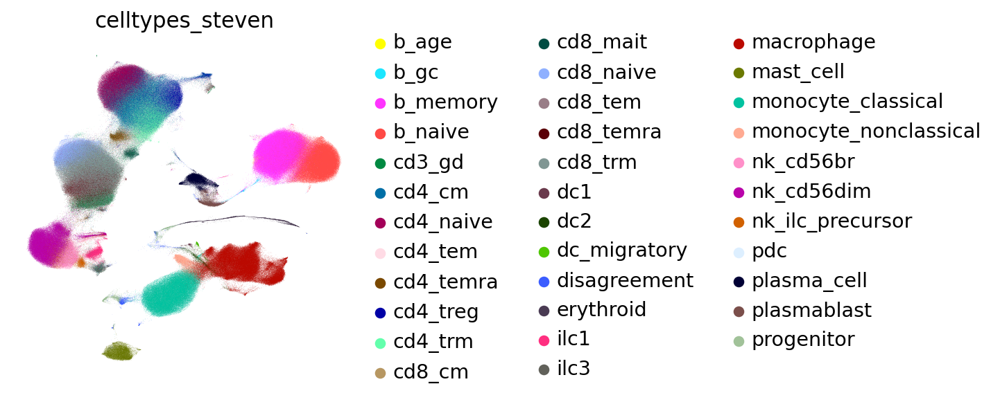

In [65]:
sc.pl.umap(immune_aging,
           color=['celltypes_steven'],
           neighbors_key="mrvi_u", vmax='p99')

In [70]:
mrvi_model.donor_info

,n_genes,n_genes_by_counts,total_counts,library,donor,site,age,sex,sample,chemistry,...,batch,bcr_library_id,tcr_library_id,celltypes_steven,celltypes_steven_old,dan_correction,schpf_groups,site_tech,donor_site_tech,_indices
_scvi_sample,,,,,,,,,,,,,,,,,,,,,
0,4809,4809,24285.0,CZINY-0536,D534,NY,33,Male,D534-BAL-1,5'v2,...,166,CZINY-552,CZINY-568,macrophage,macrophage,macrophage,macrophage,NY_5'v2,D534_NY_5'v2,0
1,1265,1265,3241.0,CZI-IA13003100,778C,UK,52,Female,778C-BLO-290,5'v2,...,86,CZI-IA13003100,CZI-IA13003100,cd4_cm,cd4_naive,cd4_cm,cd4,UK_5'v2,778C_UK_5'v2,9
2,973,973,1856.0,CZI-IA11512688,694B,UK,20,Male,694B-BMA-204,5'v2,...,64,CZI-IA11512688,CZI-IA11512688,nk_cd56dim,nk_cd56dim,nk_cd56dim,nk,UK_5'v2,694B_UK_5'v2,13
3,1671,1671,3887.0,CZINY-0351,D528,NY,64,Female,D528-ILN-1,5'v2,...,140,CZINY-0383,CZINY-0399,nk_cd56br,nk_cd56br,nk_cd56br,nk,NY_5'v2,D528_NY_5'v2,4
4,1907,1907,4694.0,CZINY-0238,D520,NY,25,Female,D520-JEJEPI-1,5'v2,...,123,CZINY-0254,CZINY-0270,cd8_trm,cd8_trm,cd8_trm,cd8,NY_5'v2,D520_NY_5'v2,15
5,1890,1890,3841.0,CZINY-0168,D512,NY,27,Female,D512-JEJLP-1,5'v2,...,114,CZINY-0184,CZINY-0192,mast_cell,mast_cell,mast_cell,mast_cell,NY_5'v2,D512_NY_5'v2,14
6,2524,2524,7830.0,CZINY-0341,D528,NY,64,Female,D528-LLN-1,5'v2,...,143,CZINY-0373,CZINY-0389,cd8_trm,cd8_trm,cd8_trm,cd8,NY_5'v2,D528_NY_5'v2,1
7,1651,1651,3246.0,CZINY-0296,D523,NY,20,Female,D523-LNG-1,5'v2,...,135,CZINY-0312,CZINY-0328,macrophage,macrophage,macrophage,macrophage,NY_5'v2,D523_NY_5'v2,5
8,1752,1752,5668.0,CZINY-0345,D528,NY,64,Female,D528-MLN-1,5'v2,...,145,CZINY-0377,CZINY-0393,b_memory,b_memory,b_memory,b,NY_5'v2,D528_NY_5'v2,3


In [74]:
donor_keys = [
    ("gut", "nn"),
    ("lung", "nn"),
    ("ln", "nn")
]
pvals = mrvi_model.compute_cell_scores(donor_keys=donor_keys, compute_pval=False, batch_size=2048)
#effect_size = mrvi_model.compute_cell_scores(donor_keys=donor_keys, compute_pval=False)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 621/621 [04:05<00:00,  2.53it/s]


In [76]:
pvals

<xarray.Dataset>
Dimensions:              (cell_name: 1270806)
Coordinates:
  * cell_name            (cell_name) object 'CGAATGTCAATAAGCA-1_CZINY-0536-14...
Data variables:
    gut_nn_effect_size   (cell_name) float32 -0.4927 -0.1998 ... -0.09506
    lung_nn_effect_size  (cell_name) float32 -0.4873 -0.1598 ... -0.07699
    ln_nn_effect_size    (cell_name) float32 -0.1651 -0.1747 ... -0.04404

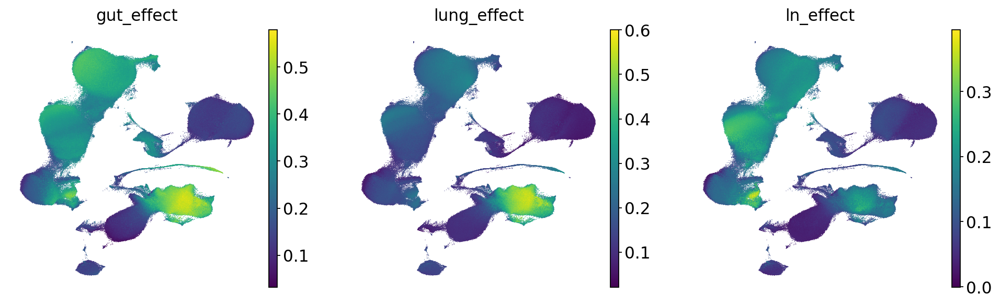

In [78]:
immune_aging.obs['gut_effect']= - pvals['gut_nn_effect_size'].values
immune_aging.obs['lung_effect']= - pvals['lung_nn_effect_size'].values
immune_aging.obs['ln_effect']= - pvals['ln_nn_effect_size'].values

sc.pl.umap(immune_aging, color=["gut_effect", "lung_effect", 'ln_effect'], size=1)

In [79]:
donor_keys = [
    ("gut", "nn"),
    ("lung", "nn"),
    ("ln", "nn")
]
pvals = mrvi_model.compute_cell_scores(donor_keys=donor_keys, compute_pval=True, batch_size=2048)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 621/621 [13:34<00:00,  1.31s/it]


In [ ]:
immune_aging.obs['gut_pval']= -np.log10(pvals['gut_nn_pval'].values)
immune_aging.obs['lung_pval']= -np.log10(pvals['lung_nn_pval'].values)
immune_aging.obs['ln_pval']= -np.log10(pvals['ln_nn_pval'].values)

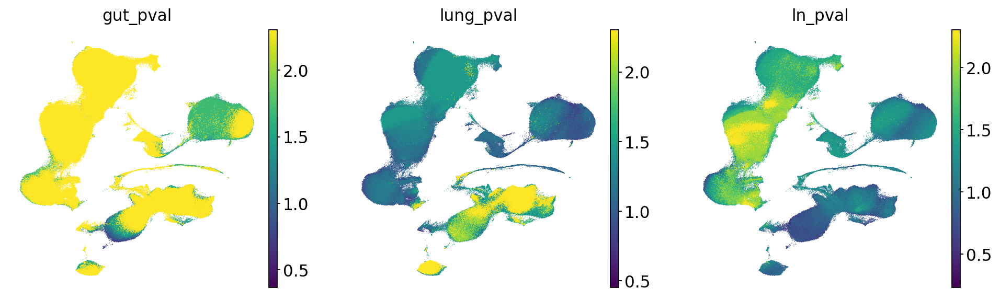

In [83]:
sc.pl.umap(immune_aging, color=["gut_pval", "lung_pval", 'ln_pval'], size=1)

# linear_model

In [8]:
immune_aging = sc.read('mrvi_immuneaging_tissue.h5ad')

In [ ]:
mrvi_model = scvi_v2.MrVI.load("immuneaging_mrvi_final_tissue_mog_groups")
mrvi_model.donor_info['gut'] = ['gut' if i in ['JEJEPI', 'JEJLP'] else 'other' for i in mrvi_model.donor_info['tissue']]
mrvi_model.donor_info['lung'] = ['lung' if i in ['LNG', 'BAL'] else 'other' for i in mrvi_model.donor_info['tissue']]
mrvi_model.donor_info['ln'] = ['ln' if i in ['MLN', 'LLN', 'ILN'] else 'other' for i in mrvi_model.donor_info['tissue']]

INFO     File immuneaging_mrvi_final_tissue_mog_groups/model.pt already downloaded                                 


In [ ]:
mrvi_model.donor_info['gut'] = mrvi_model.donor_info['gut'].astype("category")
mrvi_model.donor_info['lung'] = mrvi_model.donor_info['lung'].astype("category")
mrvi_model.donor_info['ln'] = mrvi_model.donor_info['ln'].astype("category")

In [ ]:
donor_keys = ['gut', 'lung', 'ln']

In [ ]:
linear_model = mrvi_model.perform_multivariate_analysis(donor_keys=donor_keys, batch_size=1024, store_lfc=True, offset_design_matrix=True)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1242/1242 [56:45<00:00,  2.74s/it]


In [ ]:
from dask.diagnostics import ProgressBar

# or distributed.progress when using the distributed scheduler
cd4 = linear_model.isel({"cell_name": immune_aging.obs['schpf_groups']=='macrophage'})
delayed_obj = cd4.to_netcdf("linear_model_tissue_de_macrophage.nc", compute=False)

with ProgressBar():
    results = delayed_obj.compute()

In [ ]:
from dask.diagnostics import ProgressBar

# or distributed.progress when using the distributed scheduler
cd4 = linear_model.isel({"cell_name": immune_aging.obs['schpf_groups']=='cd4'})
delayed_obj = cd4.to_netcdf("linear_model_tissue_de_cd4.nc", compute=False)

with ProgressBar():
    results = delayed_obj.compute()

[########################################] | 100% Completed | 380.29 s


In [ ]:
from dask.diagnostics import ProgressBar

# or distributed.progress when using the distributed scheduler
cd8 = linear_model.isel({"cell_name": immune_aging.obs['schpf_groups']=='cd8'})
delayed_obj = cd8.to_netcdf("linear_model_tissue_de_cd8.nc", compute=False)

with ProgressBar():
    results = delayed_obj.compute()

[########################################] | 100% Completed | 278.69 s


In [ ]:
from dask.diagnostics import ProgressBar

# or distributed.progress when using the distributed scheduler
b = linear_model.isel({"cell_name": immune_aging.obs['schpf_groups']=='b'})
delayed_obj = b.to_netcdf("linear_model_tissue_de_b.nc", compute=False)

with ProgressBar():
    results = delayed_obj.compute()

[########################################] | 100% Completed | 261.78 s


In [16]:
from dask.diagnostics import ProgressBar

# or distributed.progress when using the distributed scheduler
ilc = linear_model.isel({"cell_name": immune_aging.obs['schpf_groups'].isin(['nk', 'ilc'])})
delayed_obj = ilc.to_netcdf("linear_model_tissue_de_ilc_nk.nc", compute=False)

with ProgressBar():
    results = delayed_obj.compute()

[########################################] | 100% Completed | 138.17 s


In [ ]:
linear_model

In [ ]:
from dask.diagnostics import ProgressBar

# or distributed.progress when using the distributed scheduler
delayed_obj = linear_model.to_netcdf("linear_model_tissue_de_chunked.nc", compute=False)

with ProgressBar():
    results = delayed_obj.compute()

In [12]:
mrvi_model.donor_info

,n_genes,n_genes_by_counts,total_counts,library,donor,site,age,sex,sample,chemistry,...,celltypes_steven,celltypes_steven_old,dan_correction,schpf_groups,site_tech,donor_site_tech,_indices,gut,lung,ln
_scvi_sample,,,,,,,,,,,,,,,,,,,,,
0,4809,4809,24285.0,CZINY-0536,D534,NY,33,Male,D534-BAL-1,5'v2,...,macrophage,macrophage,macrophage,macrophage,NY_5'v2,D534_NY_5'v2,0,other,lung,other
1,1265,1265,3241.0,CZI-IA13003100,778C,UK,52,Female,778C-BLO-290,5'v2,...,cd4_cm,cd4_naive,cd4_cm,cd4,UK_5'v2,778C_UK_5'v2,9,other,other,other
2,973,973,1856.0,CZI-IA11512688,694B,UK,20,Male,694B-BMA-204,5'v2,...,nk_cd56dim,nk_cd56dim,nk_cd56dim,nk,UK_5'v2,694B_UK_5'v2,13,other,other,other
3,1671,1671,3887.0,CZINY-0351,D528,NY,64,Female,D528-ILN-1,5'v2,...,nk_cd56br,nk_cd56br,nk_cd56br,nk,NY_5'v2,D528_NY_5'v2,4,other,other,ln
4,1907,1907,4694.0,CZINY-0238,D520,NY,25,Female,D520-JEJEPI-1,5'v2,...,cd8_trm,cd8_trm,cd8_trm,cd8,NY_5'v2,D520_NY_5'v2,15,gut,other,other
5,1890,1890,3841.0,CZINY-0168,D512,NY,27,Female,D512-JEJLP-1,5'v2,...,mast_cell,mast_cell,mast_cell,mast_cell,NY_5'v2,D512_NY_5'v2,14,gut,other,other
6,2524,2524,7830.0,CZINY-0341,D528,NY,64,Female,D528-LLN-1,5'v2,...,cd8_trm,cd8_trm,cd8_trm,cd8,NY_5'v2,D528_NY_5'v2,1,other,other,ln
7,1651,1651,3246.0,CZINY-0296,D523,NY,20,Female,D523-LNG-1,5'v2,...,macrophage,macrophage,macrophage,macrophage,NY_5'v2,D523_NY_5'v2,5,other,lung,other
8,1752,1752,5668.0,CZINY-0345,D528,NY,64,Female,D528-MLN-1,5'v2,...,b_memory,b_memory,b_memory,b,NY_5'v2,D528_NY_5'v2,3,other,other,ln


In [13]:
obs_keys = ['es_' + i for i in linear_model.coords['covariate'].values]
immune_aging.obs[obs_keys] = linear_model['effect_size'].loc[{'cell_name': immune_aging.obs_names}].values

In [14]:
pval_obs_keys = ['padj_' + i for i in linear_model.coords['covariate'].values]
immune_aging.obs[pval_obs_keys] = - np.log10(1e-5 + linear_model['padj'].loc[{'cell_name': immune_aging.obs_names}].values)

In [15]:
immune_aging.obs[pval_obs_keys]

,padj_offset,padj_gutother,padj_lungother,padj_lnother
CGAATGTCAATAAGCA-1_CZINY-0536-14,-0.000004,1.690801,2.268622,0.300415
TTGGCAATCTAACTGG-1_CZINY-0341-4,-0.000004,0.679774,-0.000004,1.576671
GCCAAATGTGTGACCC-1_CZI-IA10466284-3,-0.000004,3.084210,-0.000004,0.134585
CCGTGGATCTGTCAAG-1_CZINY-0345-7,-0.000004,1.194014,-0.000004,-0.000004
ATTTCTGCAGCCTATA-1_CZINY-0351-13,-0.000004,0.627331,-0.000004,1.292737
...,...,...,...,...
GCAGCCAAGCACCGCT-1_CZI-IA13003095-4,-0.000004,1.731897,0.078482,0.960671
GAATGAAAGGCGCTCT-1_CZINY-0521-0,-0.000004,2.493536,1.501923,0.121460
AGTCTCCTCTCAGGCG-1_CZINY-0051-2,-0.000004,2.317759,0.305979,1.752349
ACGTCAAAGACTCGGA-1_CZINY-0527-6,-0.000004,3.387148,0.737541,0.972735


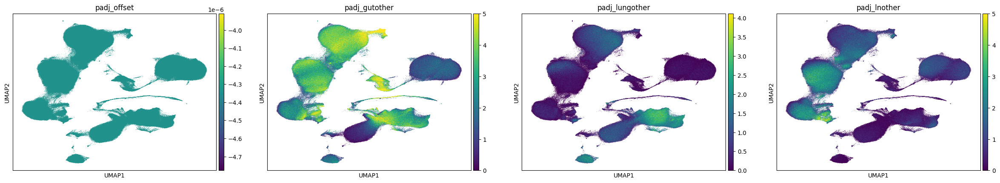

In [16]:
sc.pl.umap(immune_aging, color=pval_obs_keys, size=1)

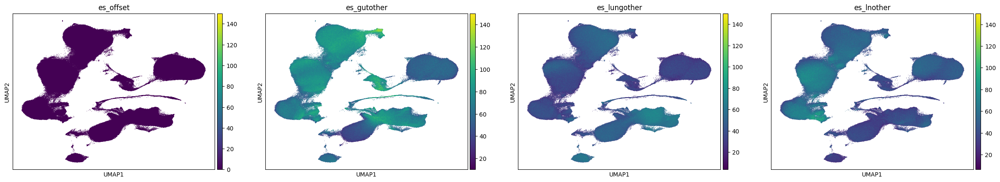

In [17]:
sc.pl.umap(immune_aging, color=obs_keys, vmax=150, size=2)

In [18]:
linear_model.coords['covariate'].values

array(['offset', 'gutother', 'lungother', 'lnother'], dtype=object)

In [19]:
linear_model

<xarray.Dataset>
Dimensions:      (cell_name: 1270806, covariate: 4, latent_dim: 30, gene: 10000)
Coordinates:
  * cell_name    (cell_name) object 'CGAATGTCAATAAGCA-1_CZINY-0536-14' ... 'T...
  * covariate    (covariate) object 'offset' 'gutother' 'lungother' 'lnother'
  * latent_dim   (latent_dim) int64 0 1 2 3 4 5 6 7 ... 22 23 24 25 26 27 28 29
  * gene         (gene) object 'AP006222.2' 'AL645608.6' ... 'AC141272.1'
Data variables:
    beta         (cell_name, covariate, latent_dim) float32 3.939e-09 ... 0.0...
    effect_size  (cell_name, covariate) float32 7.923e-13 55.61 ... 25.48 34.08
    pvalue       (cell_name, covariate) float32 1.0 0.003025 ... 0.7013 0.2776
    padj         (cell_name, covariate) float64 1.0 0.02037 ... 1.0 0.619
    lfc          (covariate, cell_name, gene) float32 0.04064 ... -0.1983

<AxesSubplot:>

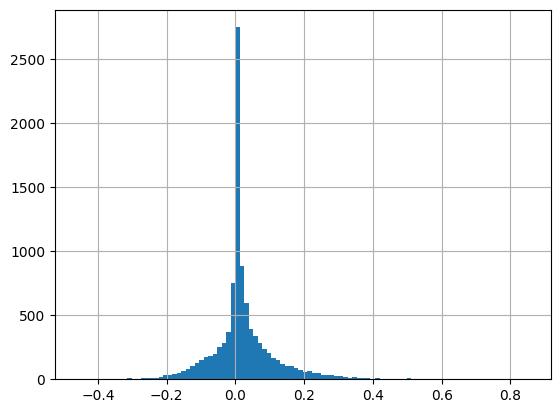

In [20]:
genes = (
    linear_model
    .loc[dict(covariate='lungother')]
    .loc[dict(cell_name=immune_aging.obs_names[immune_aging.obs['schpf_groups']=='cd4'])]
    .lfc
    .mean("cell_name")
    .to_pandas()
    .to_frame("LFC")
    .assign(absLFC=lambda x: np.abs(x.LFC))
    .sort_values("LFC", ascending=False)
    # .iloc[-100:]
)
genes.LFC.hist(bins=100)

In [21]:
genes.head(200)

,LFC,absLFC
gene,,
ADAM23,0.851887,0.851887
KRT1,0.759799,0.759799
EPGN,0.744505,0.744505
TCEAL2,0.672388,0.672388
NELL2,0.622808,0.622808
...,...,...
TMCC2,0.285403,0.285403
MXI1,0.285233,0.285233
ZNF711,0.283838,0.283838


In [25]:
linear_model = linear_model.drop_sel(covariate='offset')

In [26]:
linear_model

<xarray.Dataset>
Dimensions:      (cell_name: 1270806, covariate: 3, latent_dim: 30, gene: 10000)
Coordinates:
  * cell_name    (cell_name) object 'CGAATGTCAATAAGCA-1_CZINY-0536-14' ... 'T...
  * covariate    (covariate) object 'gutother' 'lungother' 'lnother'
  * latent_dim   (latent_dim) int64 0 1 2 3 4 5 6 7 ... 22 23 24 25 26 27 28 29
  * gene         (gene) object 'AP006222.2' 'AL645608.6' ... 'AC141272.1'
Data variables:
    beta         (cell_name, covariate, latent_dim) float32 -0.8343 ... 0.05763
    effect_size  (cell_name, covariate) float32 55.61 62.22 36.1 ... 25.48 34.08
    pvalue       (cell_name, covariate) float32 0.003025 0.0004911 ... 0.2776
    padj         (cell_name, covariate) float64 0.02037 0.005377 ... 1.0 0.619
    lfc          (covariate, cell_name, gene) float32 0.1105 0.03184 ... -0.1983

In [ ]:
linear_model = xarray.open_zarr("linear_model_tissue_de_chunked_new.zarr")